In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [2]:
def get_generator_block(input_dim, output_dim):

    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    
    def forward(self, noise):
        return self.gen(noise)

In [3]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples,z_dim,device=device)

In [4]:
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
    )

class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)


In [5]:
z_dim = 64
batch_size = 128
lr = 0.00001
device = 'cpu'

criterion = nn.BCEWithLogitsLoss()
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [8]:
dataset = MNIST(root="../Data/", transform=transforms.ToTensor(), download=False)
dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True)

In [ ]:
# 打印 DataLoader 返回的值的结构
for batch in dataloader:
    print(batch)   
    break  # 仅打印第一个批次，以避免输出过多  

In [17]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)

    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
   
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [18]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

Step 0: Generator loss: 0.0013708579540252686, discriminator loss: 0.0013848764896392822


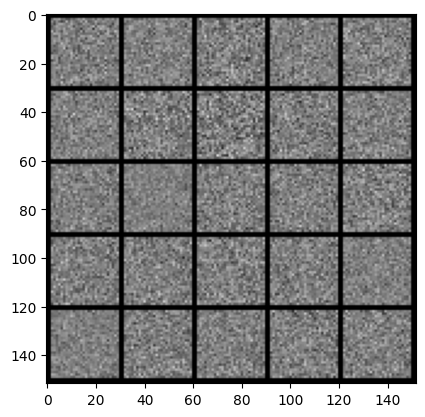

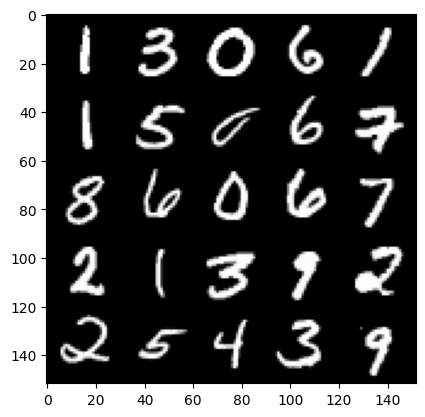

Step 100: Generator loss: 0.1588692682981491, discriminator loss: 0.12771012353897088


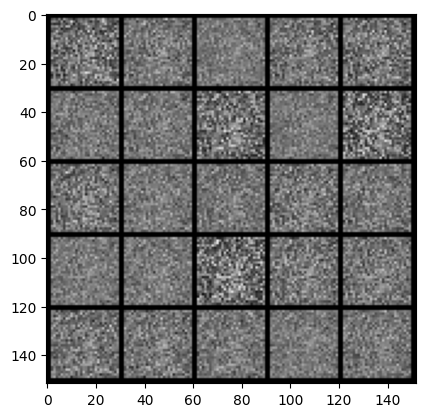

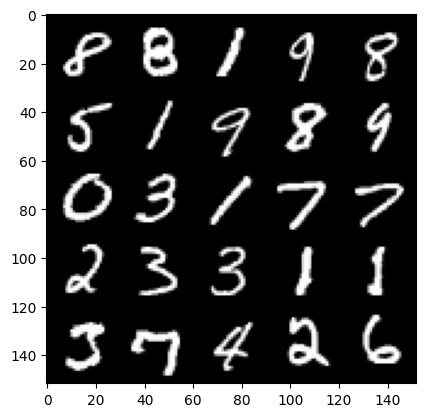

Step 200: Generator loss: 0.22000491929054247, discriminator loss: 0.0979468055963516


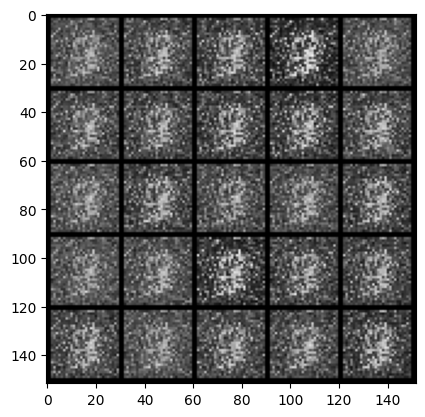

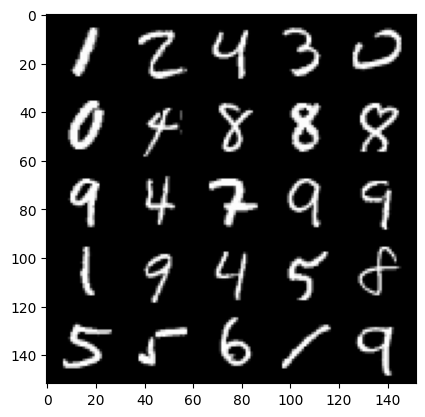

Step 300: Generator loss: 0.3024557752609252, discriminator loss: 0.06776163798570631


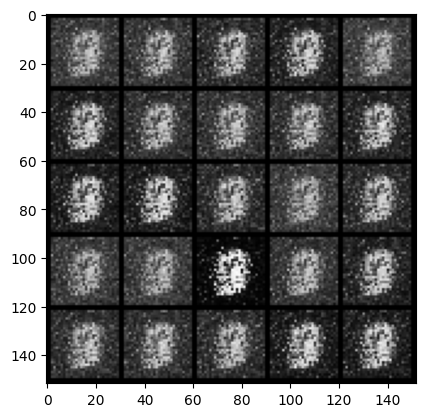

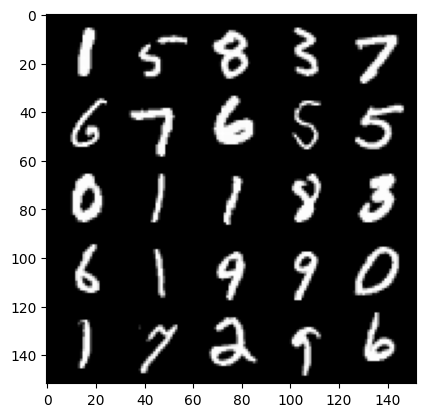

Step 400: Generator loss: 0.3614434604644773, discriminator loss: 0.05972603684663771


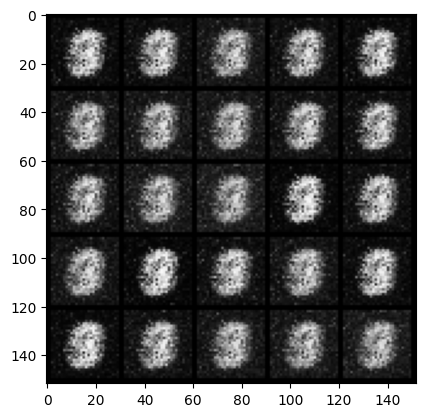

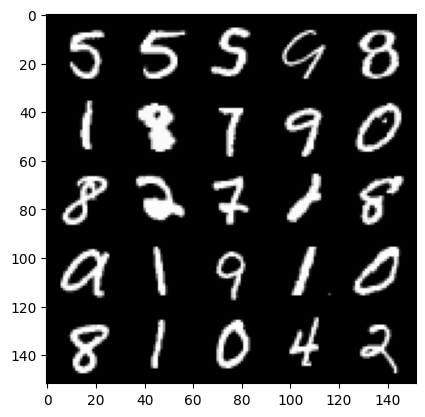

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 0.34559565782546997, discriminator loss: 0.06477692639827727


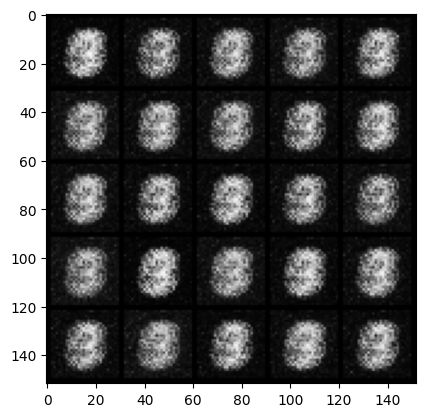

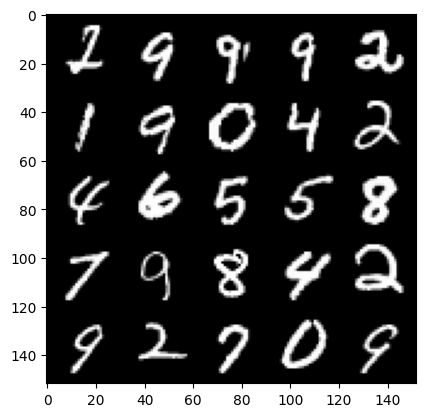

Step 600: Generator loss: 0.3200938072204589, discriminator loss: 0.06980896073579788


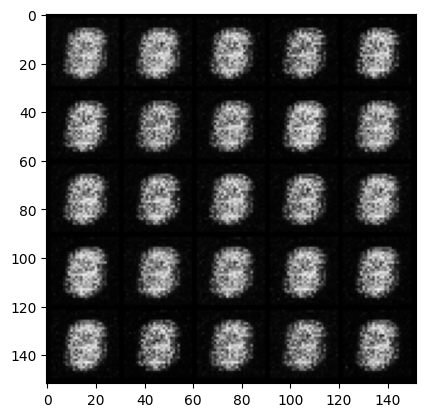

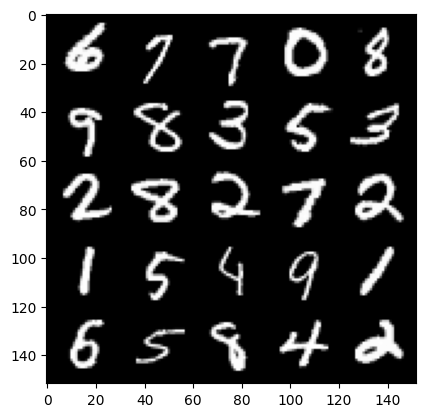

Step 700: Generator loss: 0.3200994358062745, discriminator loss: 0.06720732706785201


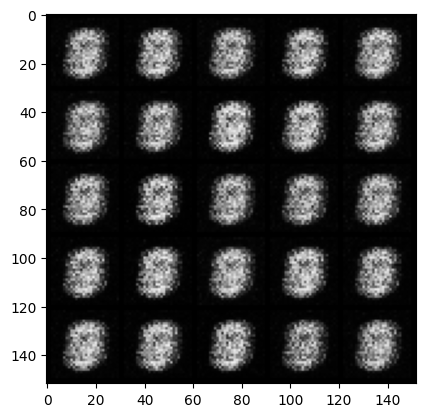

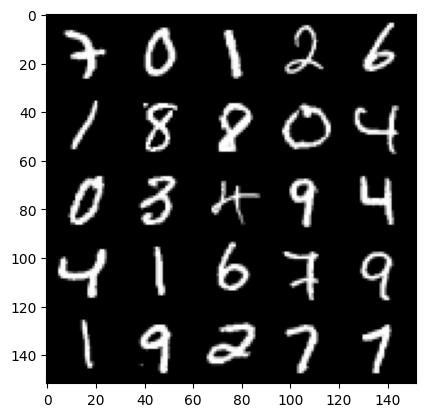

Step 800: Generator loss: 0.33184344863891596, discriminator loss: 0.06035868394374849


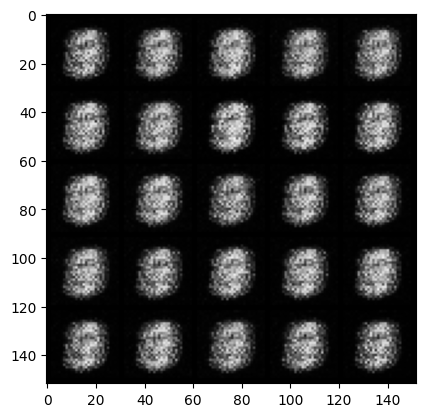

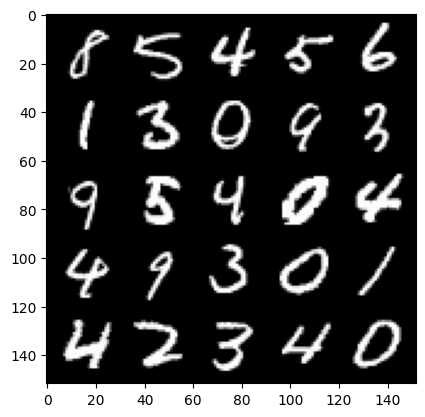

Step 900: Generator loss: 0.3415439136028289, discriminator loss: 0.054523414015769954


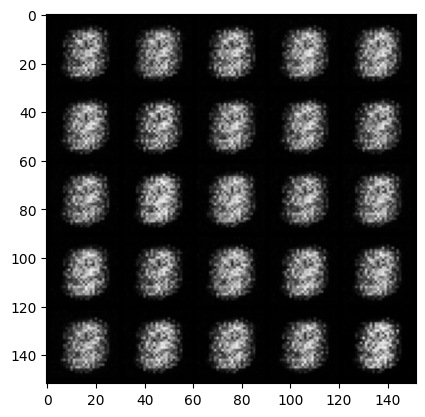

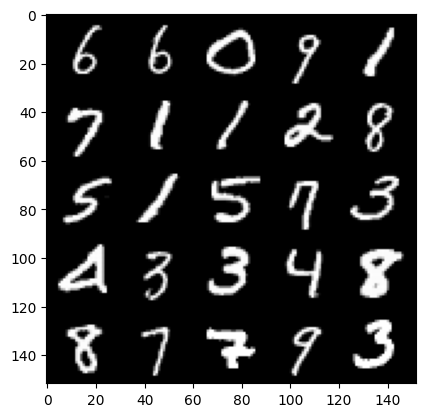

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 0.3667945966720581, discriminator loss: 0.04561066976189612


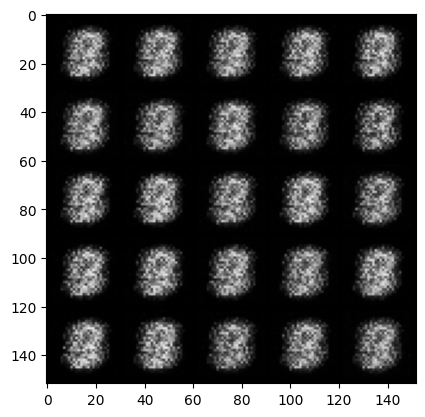

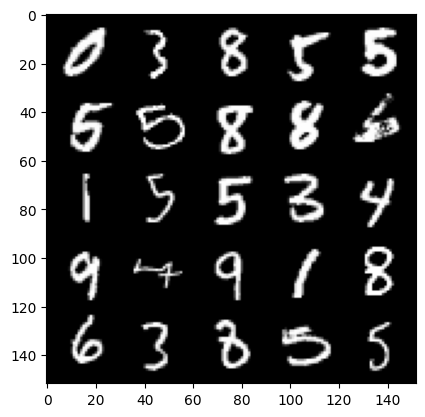

Step 1100: Generator loss: 0.38234047842025753, discriminator loss: 0.03981444695591927


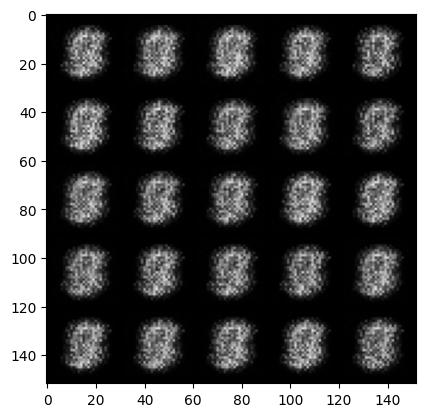

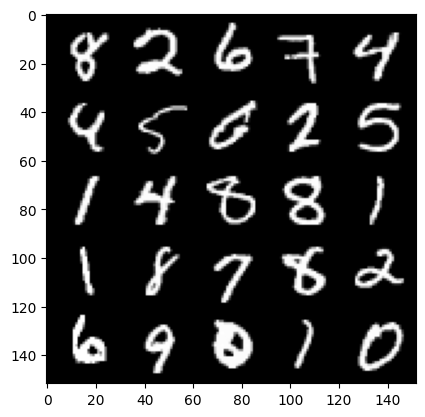

Step 1200: Generator loss: 0.3863784849643707, discriminator loss: 0.036961835771799074


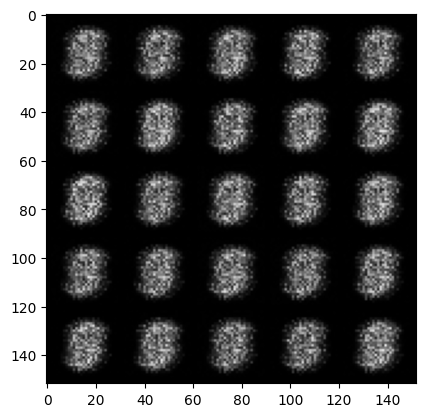

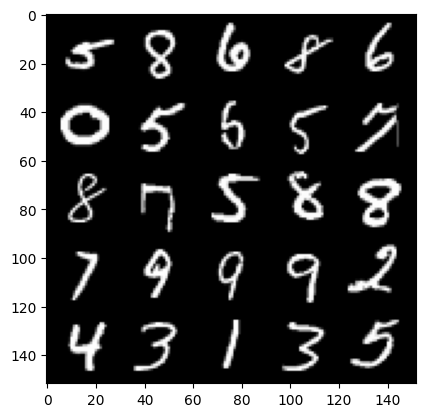

Step 1300: Generator loss: 0.3967927172183993, discriminator loss: 0.03315089052915575


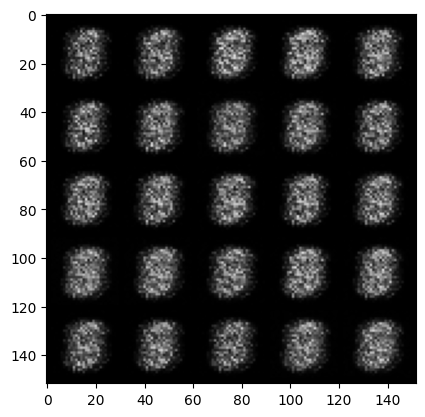

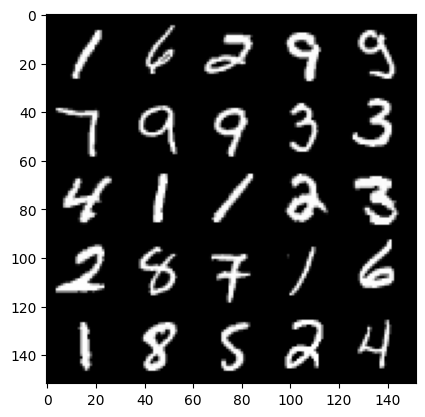

Step 1400: Generator loss: 0.4013314180374148, discriminator loss: 0.031560680896043775


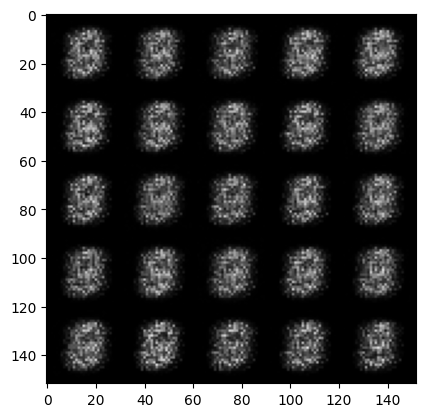

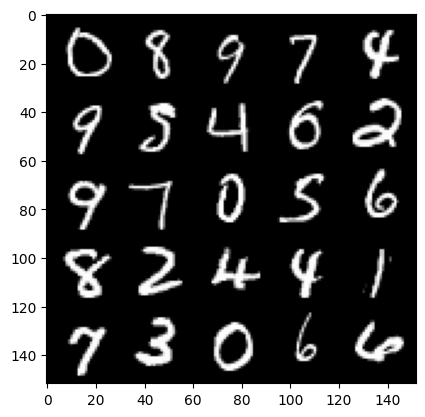

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 0.39439834165573134, discriminator loss: 0.03192143768072129


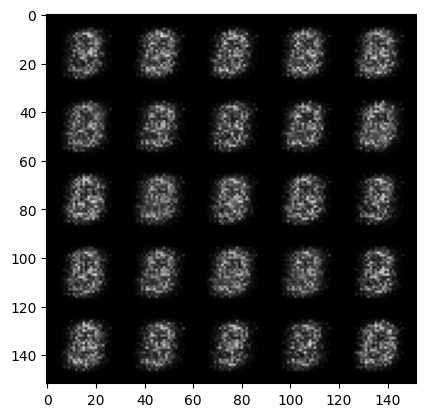

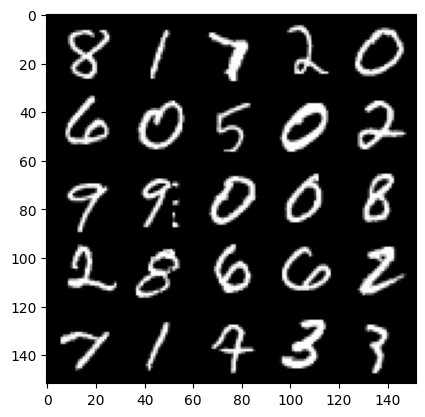

Step 1600: Generator loss: 0.3954771184921264, discriminator loss: 0.031205118983983985


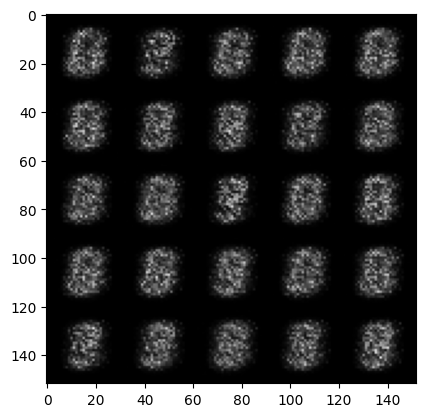

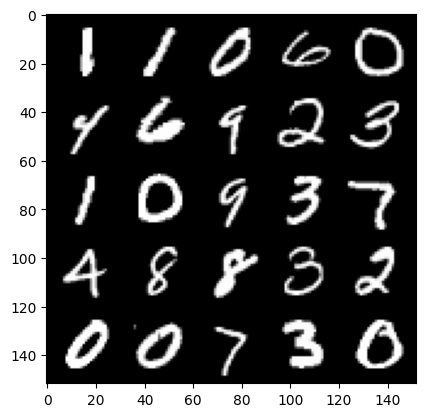

Step 1700: Generator loss: 0.35375157451629635, discriminator loss: 0.039418999701738344


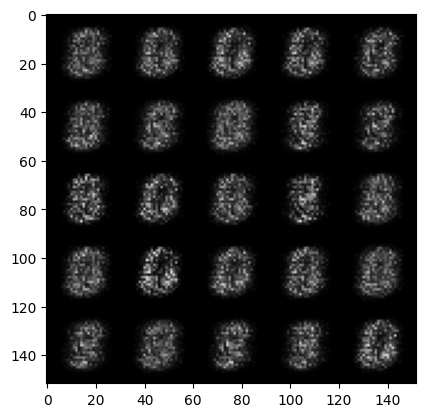

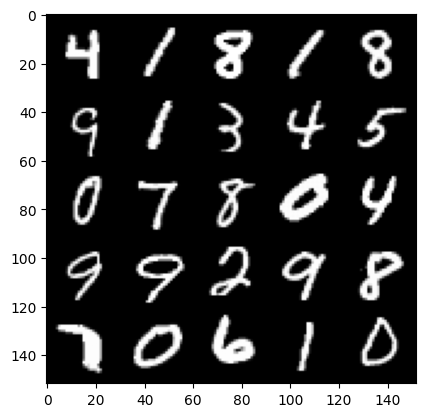

Step 1800: Generator loss: 0.3341184952259063, discriminator loss: 0.043170330733060834


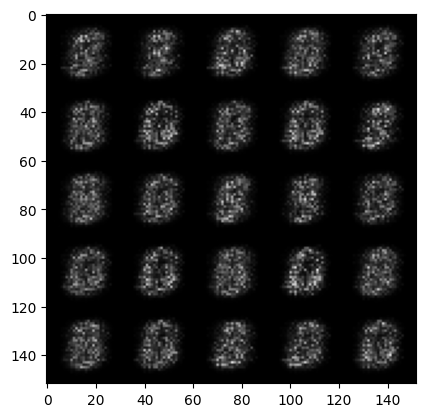

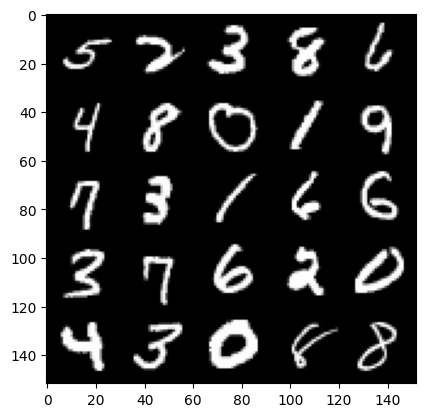

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1900: Generator loss: 0.3492883679866792, discriminator loss: 0.039018242597579945


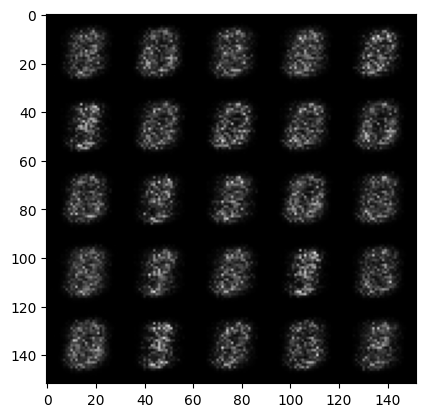

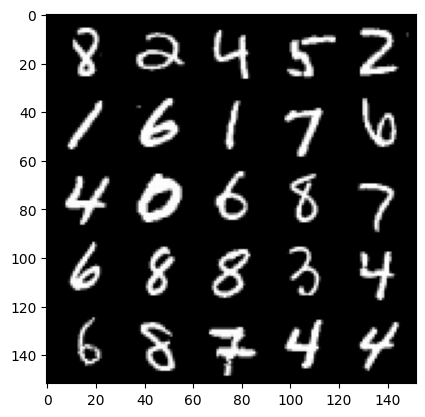

Step 2000: Generator loss: 0.3416124889850616, discriminator loss: 0.04162330982089043


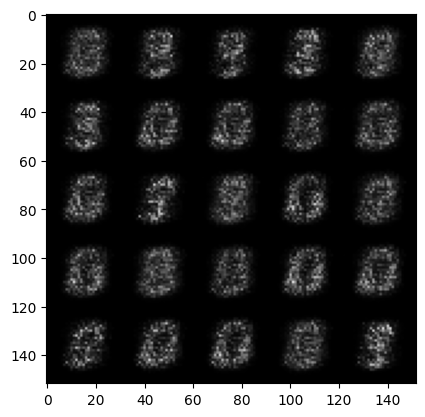

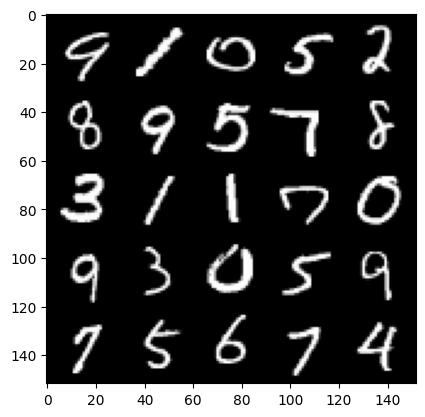

Step 2100: Generator loss: 0.31679565882682803, discriminator loss: 0.04651239904761316


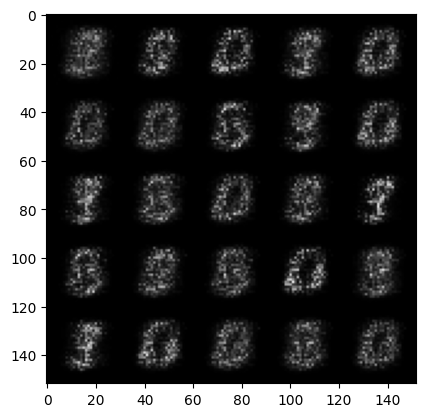

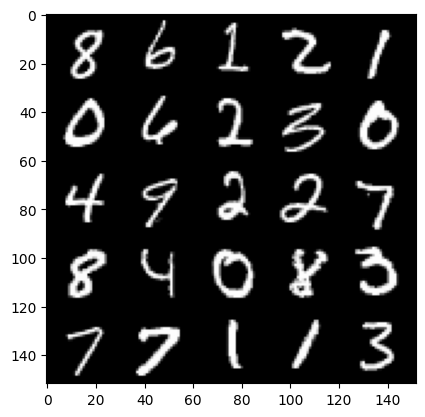

Step 2200: Generator loss: 0.32484772109985355, discriminator loss: 0.04296066725254056


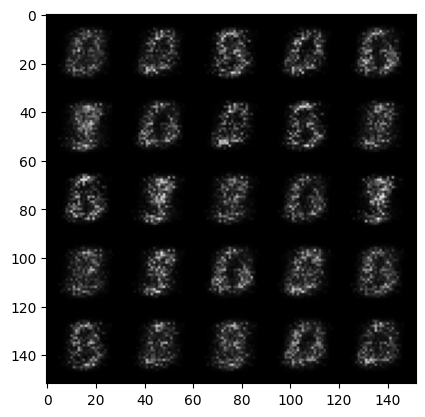

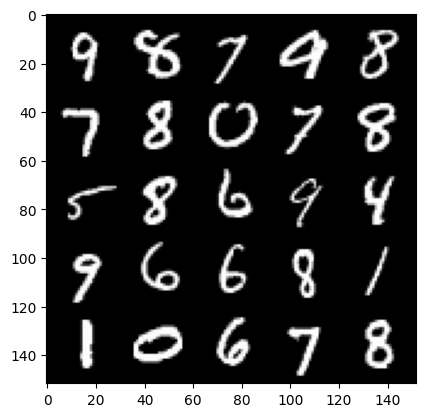

Step 2300: Generator loss: 0.3522037978172303, discriminator loss: 0.036633008211851135


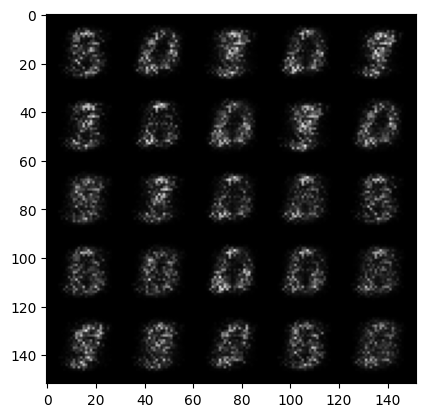

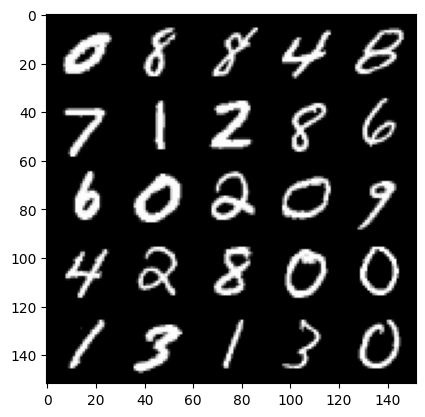

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2400: Generator loss: 0.3615728769302369, discriminator loss: 0.03541277369856836


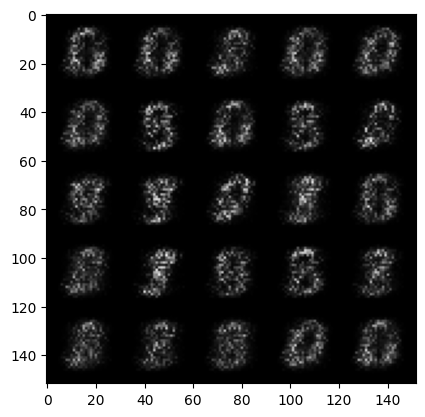

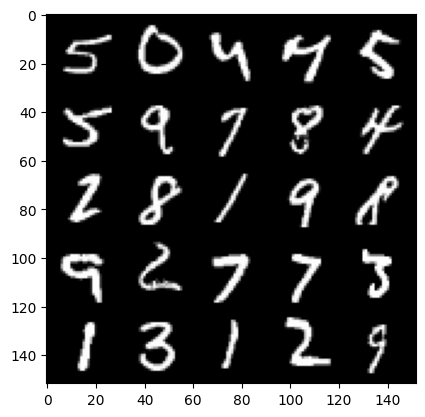

Step 2500: Generator loss: 0.3645466327667236, discriminator loss: 0.03481274530291556


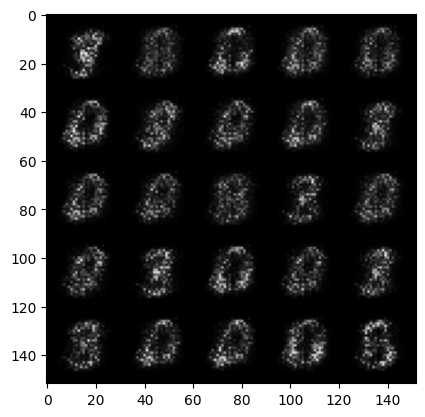

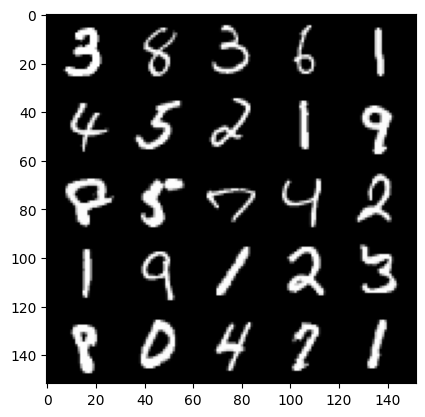

Step 2600: Generator loss: 0.3944793093204498, discriminator loss: 0.02986143846809864


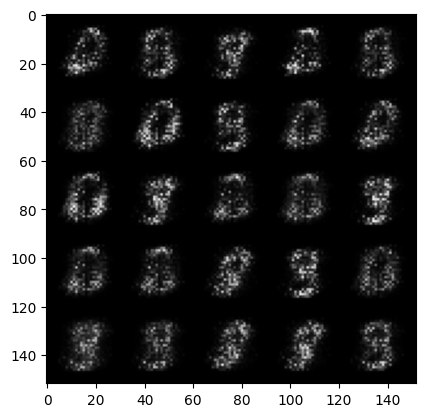

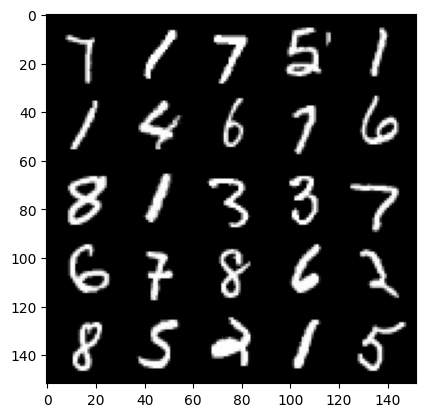

Step 2700: Generator loss: 0.3916097190380096, discriminator loss: 0.03151847831904887


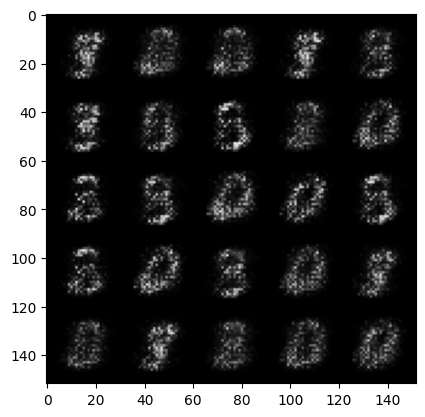

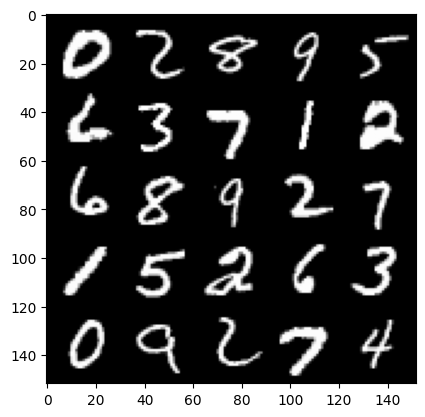

Step 2800: Generator loss: 0.3983771295547484, discriminator loss: 0.030420172497630116


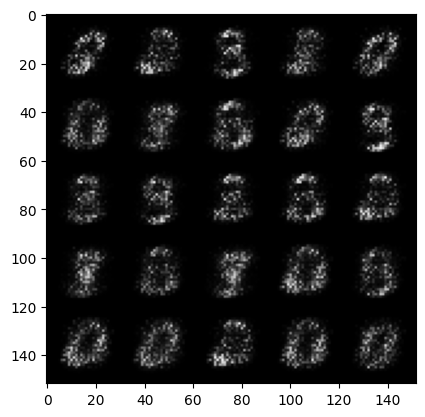

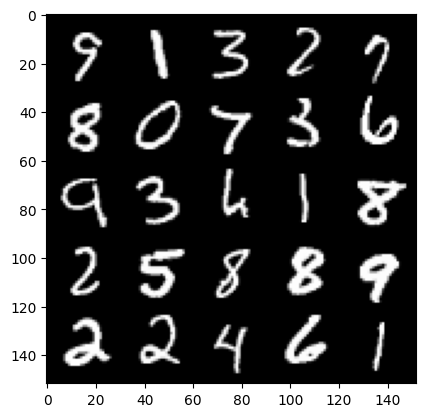

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2900: Generator loss: 0.41295246863365165, discriminator loss: 0.028927470013499254


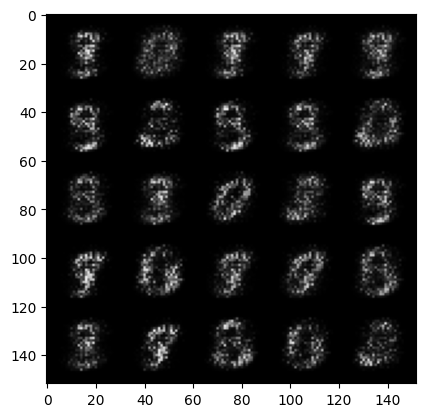

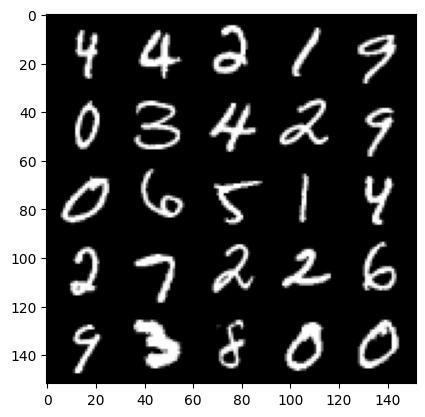

Step 3000: Generator loss: 0.42668966054916385, discriminator loss: 0.028447951123118397


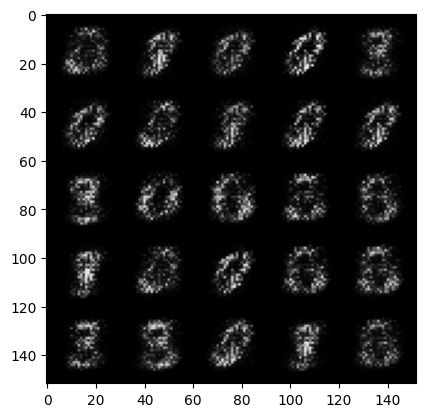

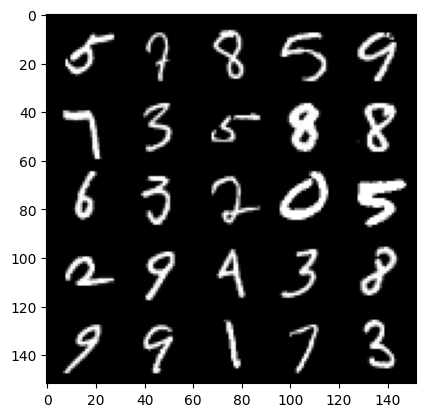

Step 3100: Generator loss: 0.4471225185394287, discriminator loss: 0.02704224506020545


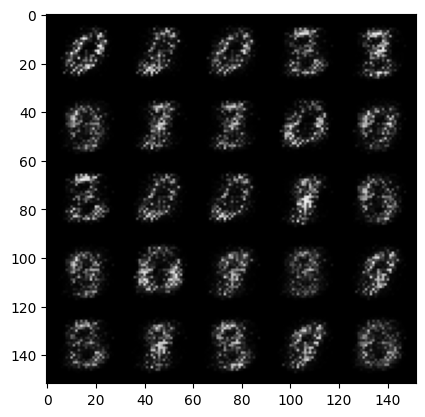

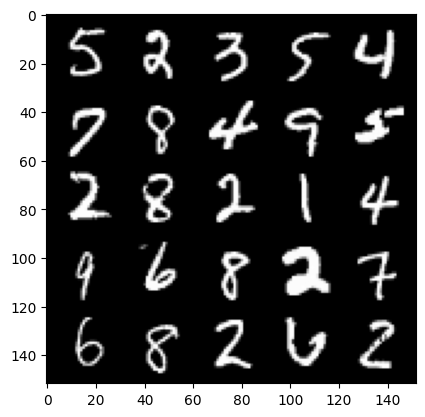

Step 3200: Generator loss: 0.47119149112701403, discriminator loss: 0.02652633221447468


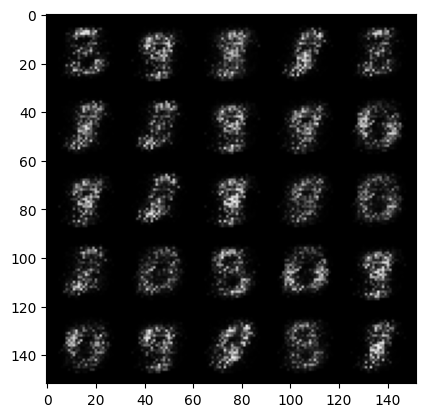

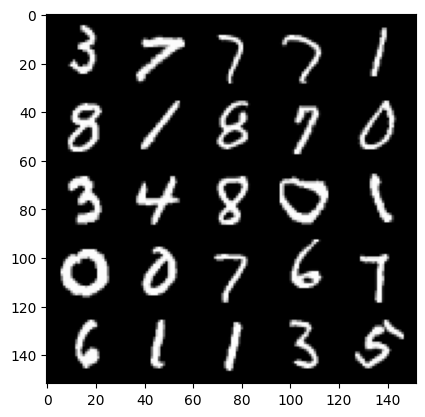

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator loss: 0.4897094860076906, discriminator loss: 0.02516150714457036


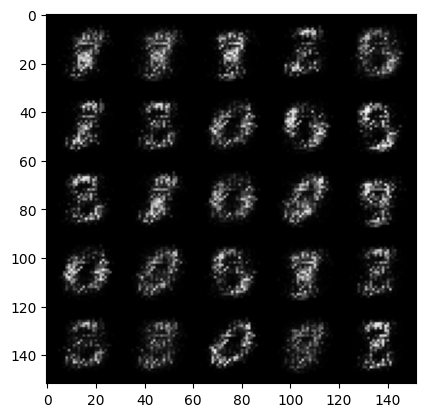

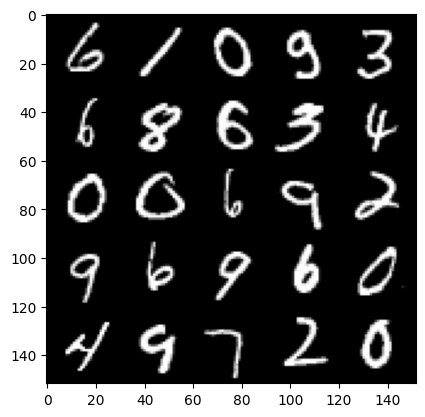

Step 3400: Generator loss: 0.513765070915222, discriminator loss: 0.02397715294361114


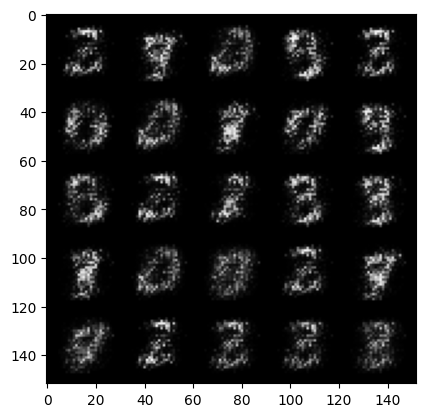

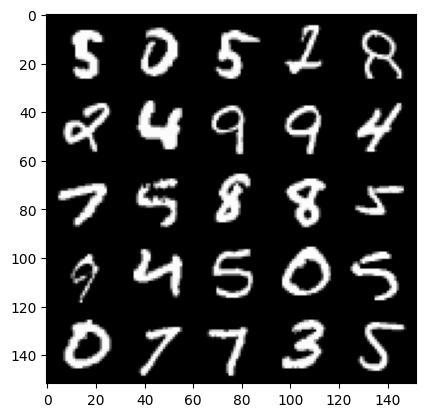

Step 3500: Generator loss: 0.5094403781890866, discriminator loss: 0.025768278822302815


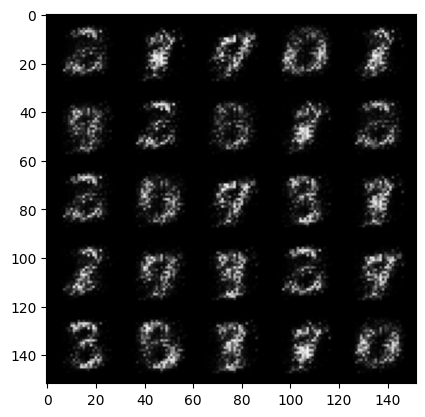

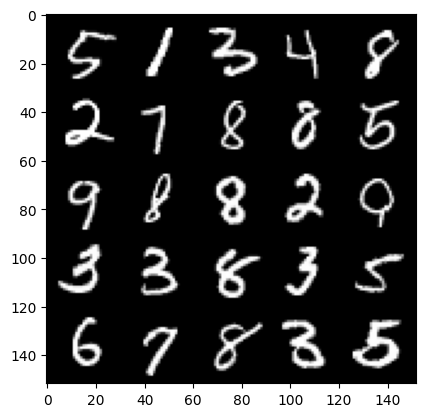

Step 3600: Generator loss: 0.5134476695060731, discriminator loss: 0.02509830637276173


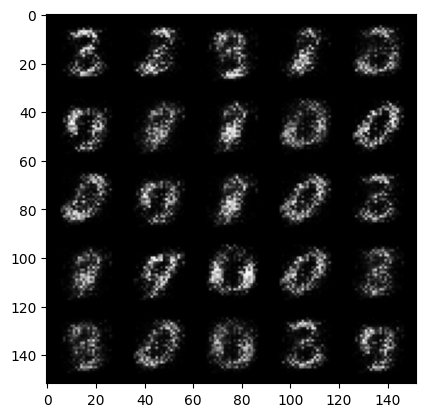

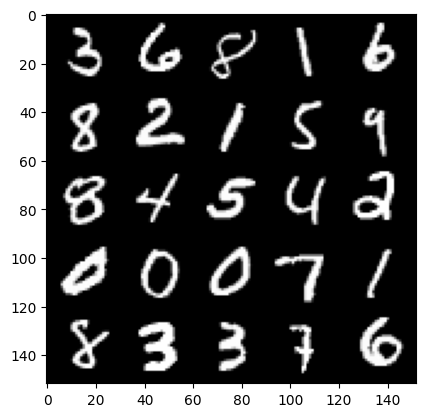

Step 3700: Generator loss: 0.5348120708465575, discriminator loss: 0.02441648001968861


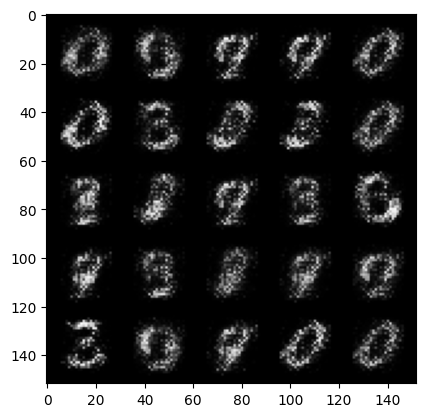

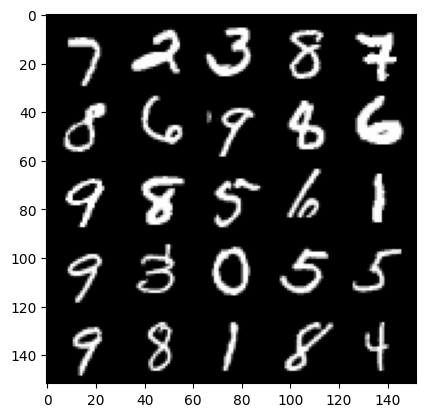

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3800: Generator loss: 0.5563797559738161, discriminator loss: 0.024284999579191204


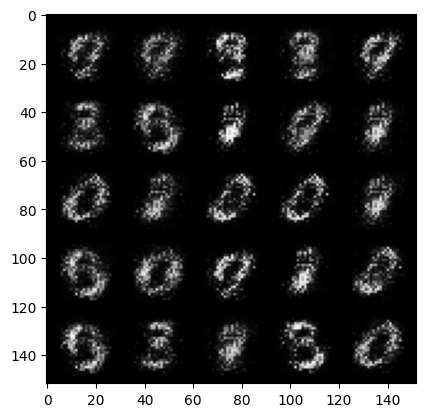

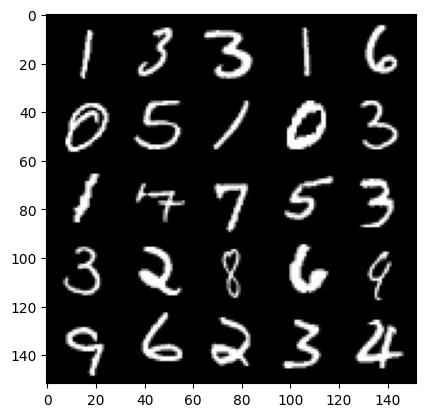

Step 3900: Generator loss: 0.5618588256835938, discriminator loss: 0.024260271459817885


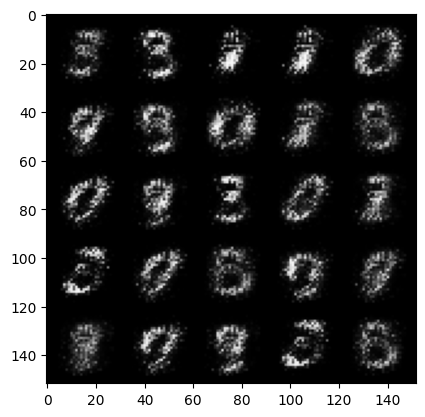

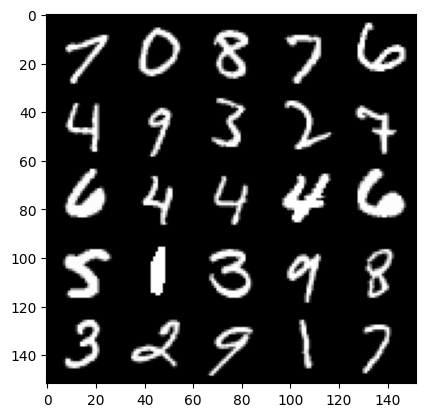

Step 4000: Generator loss: 0.573446059703827, discriminator loss: 0.023414281859993936


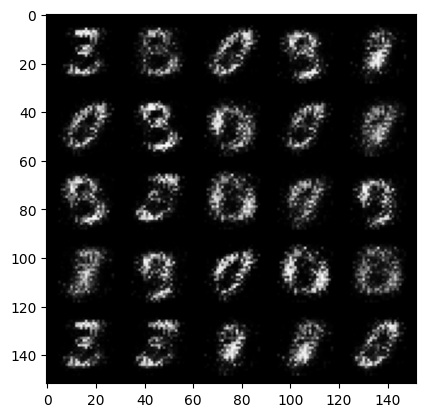

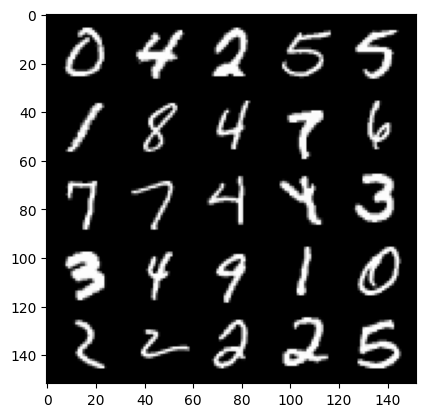

Step 4100: Generator loss: 0.5864902110099791, discriminator loss: 0.02326427048444747


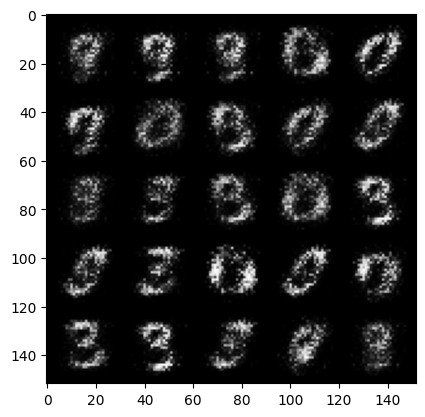

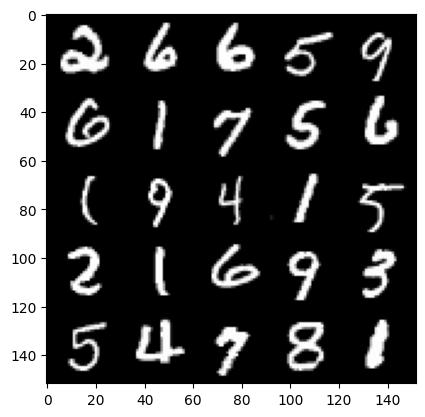

Step 4200: Generator loss: 0.6110860824584963, discriminator loss: 0.021736891701817515


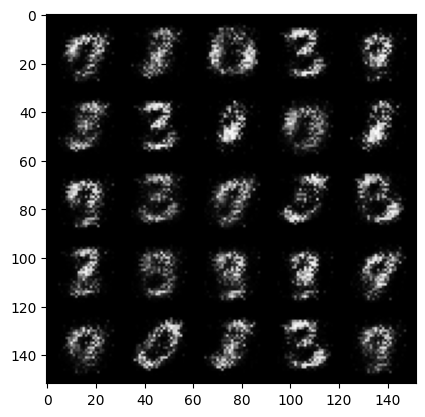

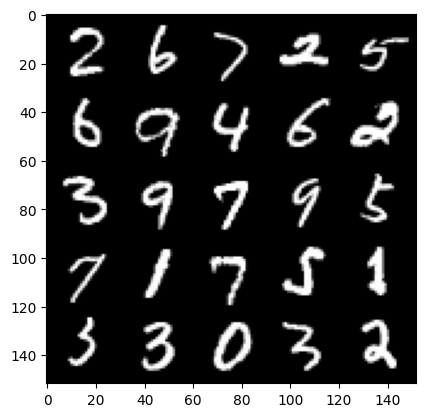

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4300: Generator loss: 0.6119441485404964, discriminator loss: 0.021382705405354495


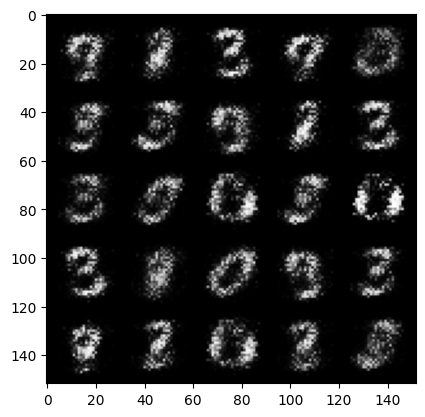

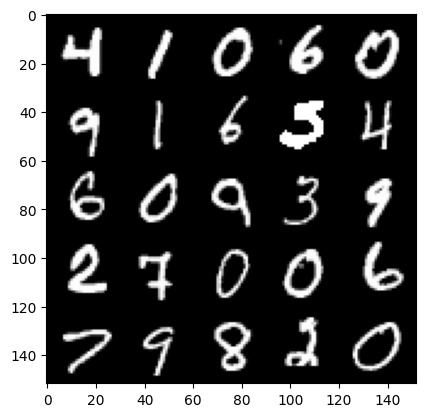

Step 4400: Generator loss: 0.6154868946075437, discriminator loss: 0.019501084402203567


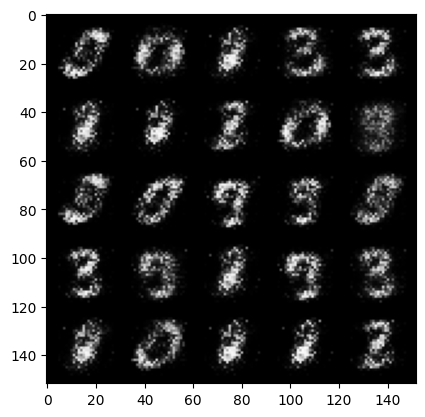

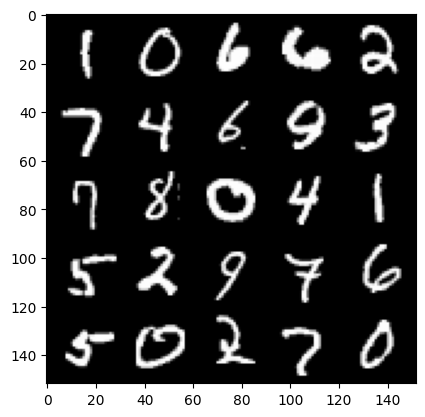

Step 4500: Generator loss: 0.6127640123367311, discriminator loss: 0.018084763988852497


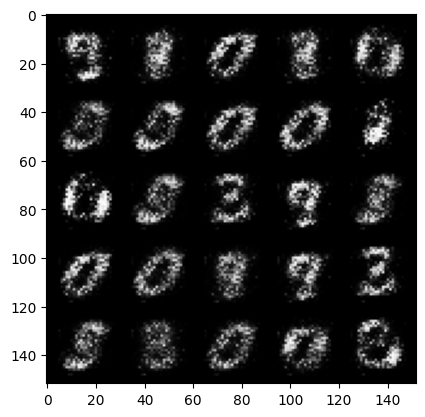

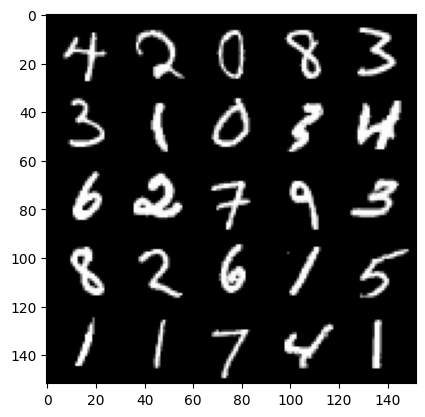

Step 4600: Generator loss: 0.6395336084365842, discriminator loss: 0.017803529337048533


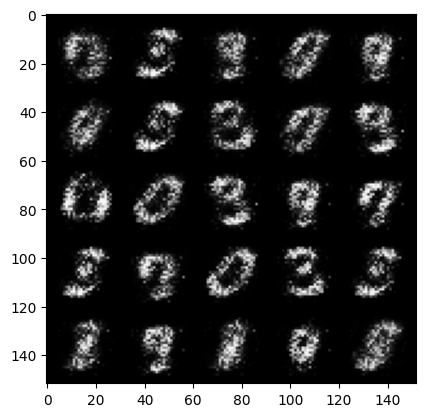

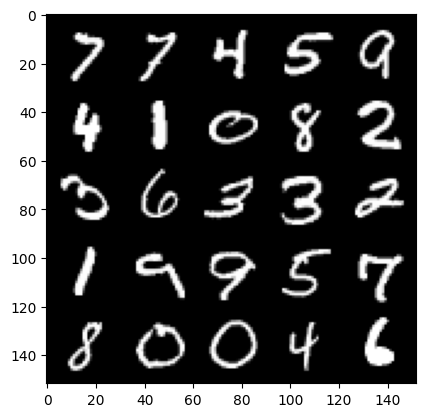

In [19]:
n_epochs = 10
display_step = 500

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
gen_loss = False

for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        ### Update discriminator ###
        disc_opt.zero_grad()
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)        
        gen_opt.zero_grad()
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        # if cur_step % display_step == 0 and cur_step > 0:
        if cur_step % display_step == 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
